# **Puddle World**

In this guide, we provide a step-by-step walkthrough on preparing the Puddle World environment for the Competition.

Firstly, we cover the installation of the environment and related dependencies, both for local setup and utilization within a Colab notebook.

Next, we detail the process of initializing the environment with desired configurations and demonstrate how to visualize its characteristics. The goal of the competition is to design an agent that does well in the five provided configurations. Therefore, we show you how to load all the various versions of the environment and inspect their characteristics.

Given the objective of designing a competent agent, we present suggestions for deploying random, human, or untuned DQN agents within the environment. Observing all these different baseline behaviors serves as a valuable starting point for your work.

Finally, it's time to design and train a single agent capable of superior performance across the five configurations of the environment. Testing the agent on these configurations, with the first being the default environment as described in the paper, is crucial. We provide instructions on saving results in a CSV file for submission, marking the beginning of your journey.

Whether you're new to the field and eager to explore or an experienced practitioner aiming to refine your skills, this competition provides a platform to utilize your knowledge and creativity!

### Additional Resources  

(stuff I found or was pointed to; not sure of usefulness yet)

From:  https://aleksandarhaber.com/introduction-to-state-transition-probabilities-actions-and-rewards-with-openai-gym-reinforcement-learning-tutorial/  

The output of: 

env.P[0][1] #state 0, action 1  

is

[(0.3333333333333333, 0, 0.0, False),
(0.3333333333333333, 4, 0.0, False),
(0.3333333333333333, 1, 0.0, False)]

This output should be interpreted as follows

(transition probability, next state, reward, Is terminal state?)

That is

1. Transition probability from state 0 and under action 1 (DOWN) to state 0 is 1/3, obtained reward is 0, and the state 0 (final state) is not a terminal state.  
2. Transition probability from state 0 and under action 1 (DOWN) to state 4 is 1/3, obtained reward is 0, and the state 4 (final state) is not a terminal state.  
3. Transition probability from state 0 and under action 1 (DOWN) to state 1 is 1/3, obtained reward is 0, and the state 1 (final state) is not a terminal state.  

From:  https://freedium.cfd/https://towardsdatascience.com/deep-q-learning-is-no-rocket-science-e34912f1864  

Discusses DQN, and describes actor-critic methods as a hybrid of Q learning and Policy gradient.

# 1. Installing the Requirements

In this section, you can find the necessary information for installing the environment and relavant libraries for your work.

## 1.1. For Google Colab

You can access the gym-puddle library for colab by installing the repository by the following command.
You can also include other necessary installations of your own here.

In [1]:
# !pip install git+https://github.com/Amii-Open-Source/gym-puddle.git
# !pip install git+https://github.com/DLR-RM/stable-baselines3@f375cc393938a6b4e4dc0fb1de82b4afca37c1bd
# !apt-get install -y xvfb x11-utils
# !pip install pyvirtualdisplay
# !pip install --upgrade ipykernel

## 1.2. Local

You can install the library locally by making a virtual environment, and installing the library by pip. The following commands show the details
You can also find the exact versions of other libraries in the `setup.py` file in the repository.


```
python -m venv myenv
source myenv/bin/activate
pip install -e .
```



# 2. Introduction to the Environment

The "Puddle World" environment provides an interface for reinforcement learning experiments. It features puddles and challenges agents to navigate to specified goal positions while avoiding the puddles with larger negative rewards.
You can access key details like starting position, goal location, and action noise levels. By printing these attributes, you can gain insights into the environment's layout and develop strategies for training reinforcement learning algorithms effectively within the Puddle World domain.
Here is the default Puddle World configuration inspired by the [original paper](/http://incompleteideas.net/papers/sutton-96.pdf):

**Actions**

There are four actions: up, down, right, and left.
Each action moves approximately 0.05 in these directions. For the case where an action would take the agent out of the screen limits, the action does not move the agent instead.

A random gaussian noise with standard deviation 0.01 is also added to the motion along both dimensions.

**Reward**

The reward is -1 for each time step, plus some additional penalty if the agent gets into the puddle.
The penalty is -400 times the distance into the puddle (distance to the nearest edge).


**Puddle Positions**

The puddles's top-left position is [0.  , 0.85] and [0.35, 0.9] respectively, and the width and height for them is [0.55, 0.2 ] and [0.2, 0.6].

**Start Position**

The agent starts each episode at [0.2, 0.4].

**Goal Position**

The episode ends succesfully if the agent reaches [1.0, 1.0] which is the goal position.


In [1]:
import gymnasium as gym
import gym_puddle

from stable_baselines3 import DQN
from stable_baselines3.dqn import MlpPolicy as DQNPolicy  # not sure why MlpPolicy is aliased as DQNPolicy

import time
import json

import matplotlib.pyplot as plt
import numpy as np

from IPython import display
import pyvirtualdisplay
import cv2 # ! pip install opencv-python

import torch
import optuna
from optuna import create_study
from typing import Any, Dict

c:\Users\ron_d\myenv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Here are the printed details about the environment.

In [2]:
  env = gym.make("PuddleWorld-v0")

  print("start position:", env.get_wrapper_attr("start"))
  print("goal position:", env.get_wrapper_attr("goal"))
  print("goal threshold:", env.get_wrapper_attr("goal_threshold"))
  print("action noise:", env.get_wrapper_attr("noise"))
  print("agent's thrust:", env.get_wrapper_attr("thrust"))
  print("puddle top left positions:", env.get_wrapper_attr("puddle_top_left"))
  print("puddle widths and heights:", env.get_wrapper_attr("puddle_width"))
  print("action space:", env.get_wrapper_attr("actions"))
  print("observation space:", env.get_wrapper_attr("observation_space"))

start position: [0.2 0.4]
goal position: [1. 1.]
goal threshold: 0.1
action noise: 0.01
agent's thrust: 0.05
puddle top left positions: [array([0.  , 0.85]), array([0.35, 0.9 ])]
puddle widths and heights: [array([0.55, 0.2 ]), array([0.2, 0.6])]
action space: [array([-0.05,  0.  ]), array([0.05, 0.  ]), array([ 0.  , -0.05]), array([0.  , 0.05])]
observation space: Box(0.0, 1.0, (2,), float64)


Here is the visualization of the environment for the default configuration.

In [3]:
#some functions to help the visualization and interaction with the environment

def visualize(frames, video_name = "video.mp4"):
    # Saves the frames as an mp4 video using cv2
    video_path = video_name
    height, width, _ = frames[0].shape
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    video_writer = cv2.VideoWriter(video_path, fourcc, 30, (width, height))
    for frame in frames:
        video_writer.write(frame)
    video_writer.release()

def online_rendering(image):
    #Visualize one frame of the image in a display
    ax.axis('off')
    img_with_frame = np.zeros((image.shape[0]+2, image.shape[1]+2, 3), dtype=np.uint8)
    img_with_frame[1:-1, 1:-1, :] = image
    ax.imshow(img_with_frame)
    display.display(plt.gcf())
    display.clear_output(wait=True)


def prepare_display():
  #Prepares display for onine rendering of the frames in the game
  _display = pyvirtualdisplay.Display(visible=False,size=(1400, 900))
  _ = _display.start()
  fig, ax = plt.subplots(figsize=(5, 5))
  ax.axis('off')


def get_action():
    action = None
    while action not in ["w", "a", "s", "d", "W", "A", "S", "D"]:
        action = input("Enter action (w/a/s/d): ")
    if action == "w":
        return 3
    elif action == "a":
        return 0
    elif action == "s":
        return 2
    elif action == "d":
        return 1


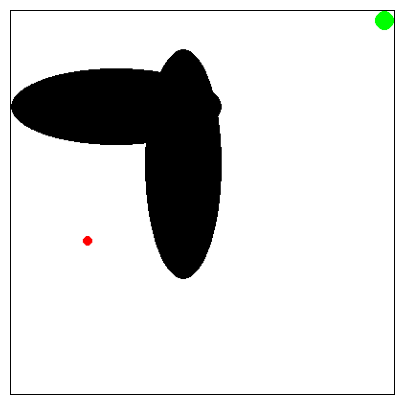

In [4]:
obs, info = env.reset()
image = env.render()
fig, ax = plt.subplots(figsize=(5, 5))
online_rendering(image)

## 2.1 Accessing Different Environment Configurations

Your task is to train an agent that can generalize well across different provided configurations of the environment. Each of these configurations feature different positions for puddles, which makes it challenging for the agent to find the most rewarding path to the goal.


You can find these configurations in the `env_configs` folder of the repository. In order to access each version of the environment, you can provide the `.json` file indicating the environment details, and intitialize the puddle world as follows:
(Note that if you are using colab, you should upload the configs to the files section of the colab)
The puddle positions are different in these configurations, but other aspects of the environment remain the same.

Valérie: Since env_setup is where the loaded json file has its particularities (puddle number and placement), if you just call gym.make(puddleworld), you don't get those particularities loaded as env_setup isn't called in `.make()`'s parameters.  

We'll stick with pw1 for now, which I think is the default that's loaded if you simply call gym.make(puddleworld).

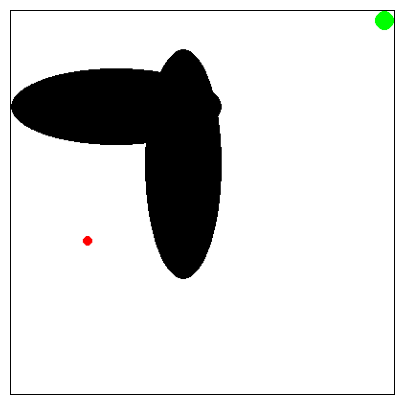

In [5]:
json_file = f"gym_puddle/env_configs/pw1.json"
#json_file = f"/content/pw1.json"

with open(json_file) as f:
  env_setup = json.load(f)

# the parameters passed below are what set up the number and placement of the puddles; if you just call
# env = gym.make("PuddleWorld-v0") you get the basic setup with two intersecting puddles in the top left.
env = gym.make(
  "PuddleWorld-v0",
  start=env_setup["start"],
  goal=env_setup["goal"],
  goal_threshold=env_setup["goal_threshold"],
  noise=env_setup["noise"],
  thrust=env_setup["thrust"],
  puddle_top_left=env_setup["puddle_top_left"],
  puddle_width=env_setup["puddle_width"],
)

obs, info = env.reset()
image = env.render()
fig, ax = plt.subplots(figsize=(5, 5))
online_rendering(image)

# 3. Developing the Agents

In preparation for the competition, we dive into the exploration of the RL framework through the introduction of three distinct agent types: random, human, and Deep Q-Network (DQN) agents.

Each agent represents varying levels of sophistication and learning abilities within the Puddle World environment. This comprehensive investigation allows us to gain valuable insights into key aspects of the environment as well as exploring RL-related methods such as the utilization of deep reinforcement learning strategies, and related libraries.

Through this exploration, you can familiarize yourself with the environment, grasp the details of the training loop, and become proficient in utilizing essential libraries such as Stable Baselines. This could be a starting point for building your own agent, either using existing libraries, and modifying them to your desires, or implementing new ideas from cutting-edge RL research!

## 3.1. Random Agent


In this section, a "random agent" is deployed to interact with the Puddle World environment. The environment is initialized and visualized, providing a starting point for the agent to explore the world. The random agent **selects actions randomly from the action space and applies them to the environment**. This process is repeated for a predetermined number of time steps (in this case, 10 steps). After each step, the agent's reward is accumulated, and the interaction is visualized through rendering the environment. Finally, the total reward earned in the total time steps is displayed, and the sequence of frames captured during the interaction is saved as a video for further analysis. This random agent serves as a baseline for you to see how the environment works and prepare for the performance of more sophisticated reinforcement learning algorithms in the Puddle World environment.

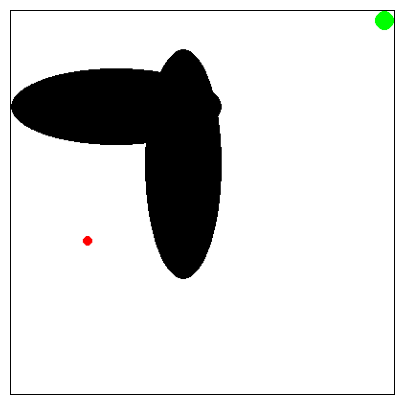

In [6]:
# sanity check
image = env.render()
fig, ax = plt.subplots(figsize=(5, 5))
online_rendering(image)

Valérie:  Random Agent - no episode loop - this reflects what was in the basic starter notebook.

It only seems to run for 1 episode of 1000 timesteps (1000 actions taken per episode until either successful termination/goal reached OR run out of time steps).

 t: 0, observation: [0.20483642 0.36315218], reward: -1, done: False, trunc: False, info: {}
 t: 1, observation: [0.25209604 0.37502663], reward: -1, done: False, trunc: False, info: {}
 t: 2, observation: [0.19590637 0.38990356], reward: -1, done: False, trunc: False, info: {}
 t: 3, observation: [0.23418072 0.37686831], reward: -1, done: False, trunc: False, info: {}
 t: 4, observation: [0.24641614 0.31353012], reward: -1, done: False, trunc: False, info: {}
 t: 5, observation: [0.22792796 0.2635125 ], reward: -1, done: False, trunc: False, info: {}
 t: 6, observation: [0.22723116 0.31020906], reward: -1, done: False, trunc: False, info: {}
 t: 7, observation: [0.17339339 0.30628144], reward: -1, done: False, trunc: False, info: {}
 t: 8, observation: [0.11731588 0.31033884], reward: -1, done: False, trunc: False, info: {}
 t: 9, observation: [0.07406124 0.3160441 ], reward: -1, done: False, trunc: False, info: {}
 t: 10, observation: [0.07637272 0.28263081], reward: -1, done: False,

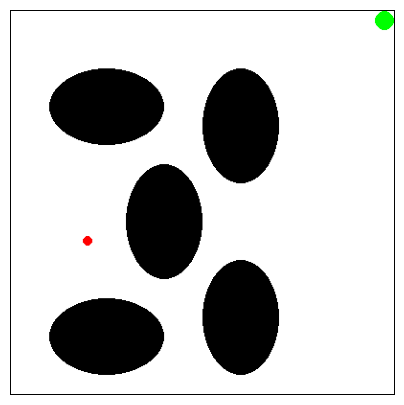

In [7]:
# #prepare_display() # uncomment this line to see the online rendering of the environment frame by frame: only needed if you want to run the code on colab

# #env = gym.make("PuddleWorld-v0") # this puts you back on some base environment and ignores the json file you picked for the puddle configuration

# # I don't understand why we don't re-specify the environment we picked up above down here so the final result reflects the file selected.
# # update: maybe the idea was to train it on the initial/basic env first, then see if it generalizes to the others ones (the DQN perhaps, not so much the random one)
# env = gym.make(
#   "PuddleWorld-v0",
#   start=env_setup["start"],
#   goal=env_setup["goal"],
#   goal_threshold=env_setup["goal_threshold"],
#   noise=env_setup["noise"],
#   thrust=env_setup["thrust"],
#   puddle_top_left=env_setup["puddle_top_left"],
#   puddle_width=env_setup["puddle_width"],
# )

# # not working (sort of?)... getting attribute error "AttributeError: 'NoneType' object has no attribute 'shape'" - a window DID open, but I got this error (...?)
# #env = gym.make("PuddleWorld-v0", render_mode="human") # you should set the render_mode to "human" to visualize the environment

# obs, info = env.reset()
# total_reward = 0
# episode_rewards = []
# frames = []

# image = env.render()
# fig, ax = plt.subplots(figsize=(5, 5))
# online_rendering(image)

# #for episode in range(101):

# for time_step in range(1000):
#     action = env.action_space.sample()  # take a random action
#     observation, reward, done, trunc, info = env.step(action)
#     total_reward += reward                                   

#     image = env.render()
#     #online_rendering(image) # uncomment this line to see the online rendering of the environment FRAME BY FRAME (goes by so fast you can't really observe... see video)
#     frames.append(image)

#     #print(f" t: {time_step}, observation: {observation}, reward: {reward}") # uncomment this line to see the environment-agent interaction details
#     print(f" t: {time_step}, observation: {observation}, reward: {reward}, done: {done}, trunc: {trunc}, info: {info}")

#     if done:
#       print(f"total reward in this episode: {total_reward}")
#       episode_rewards.append(total_reward)
#       total_reward = 0
#       break

# env.close()

# if episode_rewards == []:
#   print("no episode finished in this run.")
# else:
#   for i, reward in enumerate(episode_rewards):
#     print(f"episode {i}: reward: {reward}")

# # if episode == 100:
# #   visualize(frames, "random.mp4")

# visualize(frames, "random.mp4")


## 3.1.1 Random Agent - modified

Ok... now the problem is I had to put episode_rewards *inside* the for episodes loop, but that means it resets every time a new episode starts and I get "episode 0, reward:...".   

Note this was largely to get the agent to run several episodes of however many timesteps each.  It wasn't about trying to get nice training results.  Ultimately not super useful (other than practising coding a bit) as it's the DQN we're more interested in, and that code block seems to have an episode loop.

In [8]:
# #prepare_display() # uncomment this line to see the online rendering of the environment frame by frame: only needed if you want to run the code on colab

# #env = gym.make("PuddleWorld-v0") # this just seems to put you back on some base environment and ignores the json file you picked for the puddle configuration

# env = gym.make(
#   "PuddleWorld-v0",
#   start=env_setup["start"],
#   goal=env_setup["goal"],
#   goal_threshold=env_setup["goal_threshold"],
#   noise=env_setup["noise"],
#   thrust=env_setup["thrust"],
#   puddle_top_left=env_setup["puddle_top_left"],
#   puddle_width=env_setup["puddle_width"],
# )

# # not working (sort of?)... getting attribute error "AttributeError: 'NoneType' object has no attribute 'shape'" - a window DID open, but I got this error (...?)
# #env = gym.make("PuddleWorld-v0", render_mode="human") # you should set the render_mode to "human" to visualize the environment

# successful_episodes = 0

# for episode in range(101):

#   obs, info = env.reset()
#   total_reward = 0
#   episode_rewards = []
#   frames = []

#   # image = env.render()
#   # fig, ax = plt.subplots(figsize=(5, 5))
#   # online_rendering(image)

#   for time_step in range(1000):
#       action = env.action_space.sample()  # take a random action
#       observation, reward, done, trunc, info = env.step(action)
#       total_reward += reward                                   

#       image = env.render()
#       #online_rendering(image) # uncomment this line to see the online rendering of the environment FRAME BY FRAME (goes by so fast you can't really observe... see video)
#       frames.append(image)

#       #print(f" t: {time_step}, observation: {observation}, reward: {reward}") # uncomment this line to see the environment-agent interaction details
#       print(f" t: {time_step}, observation: {observation}, reward: {reward}, done: {done}, trunc: {trunc}, info: {info}")

#       if done:
#         successful_episodes += 1
#         print(f"Successful episode # {successful_episodes}")
#         print(f"total reward in this episode: {total_reward}")
#         episode_rewards.append(total_reward)
#         total_reward = 0
#         break

#   env.close()

#   # version 1
#   # if episode_rewards == []:
#   #   print("no episode finished in this run.")
#   # else:
#   #   for i, reward in enumerate(episode_rewards):
#   #     print(f"episode: {i}, reward: {reward}")       # It's saying episode 0 each time - examine

#   # version 2
#   if episode_rewards == []:
#     print("no episode finished in this run.")
#   else:
#     for i, reward in enumerate(episode_rewards):
#       print(f"Number of appended rewards: {len(episode_rewards)}.") # it says length 1 each time, as suspected
#       print(f"episode: {i}, reward: {reward}")       # It's saying episode 0 each time

# #visualize(frames, "random.mp4")


 t: 0, observation: [0.15637839 0.41365559], reward: -1, done: False, trunc: False, info: {}
 t: 1, observation: [0.11804892 0.42845591], reward: -1, done: False, trunc: False, info: {}
 t: 2, observation: [0.13057509 0.38216571], reward: -1, done: False, trunc: False, info: {}
 t: 3, observation: [0.12726622 0.45260572], reward: -1, done: False, trunc: False, info: {}
 t: 4, observation: [0.06956751 0.43789071], reward: -1, done: False, trunc: False, info: {}
 t: 5, observation: [0.11598711 0.45047174], reward: -1, done: False, trunc: False, info: {}
 t: 6, observation: [0.12326028 0.40101928], reward: -1, done: False, trunc: False, info: {}
 t: 7, observation: [0.11449628 0.44979114], reward: -1, done: False, trunc: False, info: {}
 t: 8, observation: [0.1088136  0.39432171], reward: -1, done: False, trunc: False, info: {}
 t: 9, observation: [0.06291454 0.38178548], reward: -1, done: False, trunc: False, info: {}
 t: 10, observation: [0.12076823 0.36936297], reward: -1, done: False,

## 3.1.2 Random Agent - 'enhanced'

Another try...  it's not the agent that's enhanced, it's still random, but the code is altered to run X number of episodes (for episode loop) at however many timesteps (actions) specified, with printouts to help see what's going on.

Try putting episode_rewards above the episode for loop again, see what happens.  I *should* be seeing appended rewards every time an episode terminates successfully.

Results:

Ok, it's doing what I expected now.  It's correctly appending the results to episode_rewards going from one successful episode (done = True) to the next.  Now... because I've put the episode_rewards outside the episode for loop, it's not resetting (which is what I wanted), but that also means that when an episode ends unsuccessfully (done never flips to True), we don't get the "no episode finished in this run" message.  Not sure how much I care about that hiccup right now.  

Now I get a proper printout of each ***successful*** episode number and its associated reward tally for the number of timesteps taken to achieve it.  

> Note: the episode could be episode #9, but *successful* episode #2; the latter is what's displayed as that's what's appended to episode_rewards.  

**NOW** I need to change it so it gathers 100 *sucesssful* episodes before calling it a day, unless I've misunderstood how the rewards are to be gathered and sent to the submission code block (i.e. what do you do with a "run" where only X number of episodes actually terminated at the goal?).  Maybe it's a change from the `for episode in range(101)` over to a while loop, i.e. while succesful_episodes < 100

**THEN** I need to make it so it spits out the episode_rewards list as sort of "config_whatever#_rewards" to be processed at the end of the notebook to collect into a csv for submission.

Also consider whether it makes sense to persist in doing all of this in the Random algorithm - I won't be submitting that.  See if the other algorithms (pref DQN) are set up so wildly differently that all this work is pointless.  --> This is what I ended up exploring next.  See DQN agent, 'basic notebook' version.


In [10]:
# #prepare_display() # uncomment this line to see the online rendering of the environment frame by frame: only needed if you want to run the code on colab

# #env = gym.make("PuddleWorld-v0") # this just seems to put you back on some base environment and ignores the json file you picked for the puddle configuration

# env = gym.make(
#   "PuddleWorld-v0",
#   start=env_setup["start"],
#   goal=env_setup["goal"],
#   goal_threshold=env_setup["goal_threshold"],
#   noise=env_setup["noise"],
#   thrust=env_setup["thrust"],
#   puddle_top_left=env_setup["puddle_top_left"],
#   puddle_width=env_setup["puddle_width"],
# )

# # not working (sort of?)... getting attribute error "AttributeError: 'NoneType' object has no attribute 'shape'" - a window DID open, but I got this error (...?)
# #env = gym.make("PuddleWorld-v0", render_mode="human") # you should set the render_mode to "human" to visualize the environment

# successful_episodes = 0

# episode_rewards = []

# for episode in range(101):

#   obs, info = env.reset()
#   total_reward = 0
#   #episode_rewards = []
#   frames = []

#   # image = env.render()
#   # fig, ax = plt.subplots(figsize=(5, 5))
#   # online_rendering(image)

#   for time_step in range(1000):
#       action = env.action_space.sample()  # take a random action
#       observation, reward, done, trunc, info = env.step(action)
#       total_reward += reward                                   

#       image = env.render()
#       #online_rendering(image) # uncomment this line to see the online rendering of the environment FRAME BY FRAME (goes by so fast you can't really observe... see video)
#       frames.append(image)

#       #print(f" t: {time_step}, observation: {observation}, reward: {reward}") # uncomment this line to see the environment-agent interaction details
#       print(f" t: {time_step}, observation: {observation}, reward: {reward}, done: {done}, trunc: {trunc}, info: {info}")

#       if done:
#         successful_episodes += 1
#         print(f"Successful episode # {successful_episodes}")
#         print(f"total reward in this episode: {total_reward}")
#         episode_rewards.append(total_reward)
#         total_reward = 0
#         break

#   env.close()

#   # this if loop inside the for episode loop may reflect my initial confusion around what a "run" was considered.  I think I was equating runs with episodes.  Really a "run" is 
#   # one 'go' of this code block for however many episodes are specified in the for episode loop.
#   if episode_rewards == []:
#     print("no episode finished in this run.") # as soon as one result is appended to episode_rewards, this naturally no longer displays.  See comment above re confusion of "run"
#   else:
#     for i, reward in enumerate(episode_rewards):
#       print(f"Number of appended rewards: {len(episode_rewards)}.") # it says length 1 each time, as suspected
#       print(f"episode: {i}, reward: {reward}")       # It's listing the # of the successful episodes, not each episode regardless of termination result

#   # I haven't given the below a tonne of thought.  It's just a "what if this generates a pile of files" contingency.
#   if episode == 100:
#     visualize(frames, "random.mp4")


 t: 0, observation: [0.21010106 0.35397074], reward: -1, done: False, trunc: False, info: {}
 t: 1, observation: [0.19941501 0.40183913], reward: -1, done: False, trunc: False, info: {}
 t: 2, observation: [0.25215742 0.40876911], reward: -1, done: False, trunc: False, info: {}
 t: 3, observation: [0.24298545 0.36697748], reward: -1, done: False, trunc: False, info: {}
 t: 4, observation: [0.28057042 0.36872603], reward: -1, done: False, trunc: False, info: {}
 t: 5, observation: [0.3403585  0.37051775], reward: -91.79290191836245, done: False, trunc: False, info: {}
 t: 6, observation: [0.40534363 0.35952203], reward: -96.19118907926844, done: False, trunc: False, info: {}
 t: 7, observation: [0.40249024 0.40579037], reward: -77.68385254303492, done: False, trunc: False, info: {}
 t: 8, observation: [0.44849068 0.4029165 ], reward: -78.83339971460197, done: False, trunc: False, info: {}
 t: 9, observation: [0.5069063  0.39826598], reward: -1, done: False, trunc: False, info: {}
 t: 10

## 3.2. Human Agent

In this section, a "Human Agent" is introduced to interact with the Puddle World environment. The environment is initialized and visualized to provide a starting point for the human agent's interaction. Unlike the random agent, the human agent inputs actions directly from you. You are prompted to enter actions through the command line interface, allowing for real-time interaction. The key mapping is as follows:

w: up
a: left
s: down
d: right

The agent's chosen actions are applied to the environment, and the resulting observations and rewards are displayed. This process is repeated for a predetermined number of time steps (in this case, 10 steps). After each step, the interaction is visualized through rendering the environment. The total reward earned in the total time steps is displayed, and the sequence of frames captured during the interaction is saved as a video for more analysis. This human agent setup enables you to actively engage with the environment and assess its dynamics and challenges from a human perspective.

Valérie:  Commented out for now as I'm not working on it and didn't wish to enter moves (i.e. due to the input call) every time I ran the notebook from the top.

In [11]:
# #prepare_display() # uncomment this line to see the online rendering of the environment frame by frame: only needed if you want to run the code on colab
# #env = gym.make("PuddleWorld-v0")

# env = gym.make(
#   "PuddleWorld-v0",
#   start=env_setup["start"],
#   goal=env_setup["goal"],
#   goal_threshold=env_setup["goal_threshold"],
#   noise=env_setup["noise"],
#   thrust=env_setup["thrust"],
#   puddle_top_left=env_setup["puddle_top_left"],
#   puddle_width=env_setup["puddle_width"],
# )

# obs, info = env.reset()
# total_reward = 0
# episode_rewards = []
# frames = []

# image = env.render()
# fig, ax = plt.subplots(figsize=(5, 5))
# online_rendering(image)

# for time_step in range(10):
#     action = get_action()
#     observation, reward, done, trunc, info = env.step(action)
#     total_reward += reward

#     image = env.render()
#     # online_rendering(image) #uncomment this line to see the online rendering of the environment frame by frame
#     frames.append(image)

#     print(f" t: {time_step}, observation: {observation}, reward: {reward}")  #uncomment this line to see the environment-agent interaction details

#     if done:
#       print(f"total reward in this episode: {total_reward}")
#       episode_rewards.append(total_reward)
#       total_reward = 0
#       break

# env.close()

# if episode_rewards == []:
#   print("no episode finished in this run.")
# else:
#   for i, reward in enumerate(episode_rewards):
#     print(f"episode {i}: reward: {reward}")

# visualize(frames, "human.mp4")


## 3.3. DQN Agent

In this section, a  [ Deep Q-Network (DQN) agent](https://arxiv.org/abs/1312.5602) is utilized to interact with the Puddle World environment. The code demonstrates how to set up training with [Stable Baselines](https://stable-baselines3.readthedocs.io/en/master/), a popular library for reinforcement learning. The DQN model is initialized and trained using default hyperparameters, but you can explore and adjust these hyperparameters for optimal performance. After training, the trained model is loaded for evaluation. The environment is initialized, and the DQN agent's interaction with the environment is visualized. The agent selects actions based on the learned policy, and the environment responds accordingly. This process continues until the episode terminates. At the end of the episode, the total reward earned by the agent is displayed, and the sequence of frames captured during the interaction is saved as a video for further analysis. While the provided code serves as a starting point for training a DQN agent with stable baselines if you wish to use this library, you are encouraged to experiment with different hyperparameters to improve the agent's performance in navigating the complex dynamics of the Puddle World environment. We encourage you to explore more algorithms in the same library or build your agents from scratch.

Valérie:  there's a lot of (hyper)parameters you can set per https://stable-baselines3.readthedocs.io/en/master/modules/dqn.html  

* policy (DQNPolicy) – The policy model to use (MlpPolicy, CnnPolicy, …)
* env (Env | VecEnv | str) – The environment to learn from (if registered in Gym, can be str)
* learning_rate (float | Callable[[float], float]) – The learning rate, it can be a function of the current progress remaining (from 1 to 0)
* buffer_size (int) – size of the replay buffer
* learning_starts (int) – how many steps of the model to collect transitions for before learning starts
* batch_size (int) – Minibatch size for each gradient update
* tau (float) – the soft update coefficient (“Polyak update”, between 0 and 1) default 1 for hard update
* gamma (float) – the discount factor
* train_freq (int | Tuple[int, str]) – Update the model every train_freq steps. Alternatively pass a tuple of frequency and unit like (5, "step") or (2, "episode").
* gradient_steps (int) – How many gradient steps to do after each rollout (see train_freq) Set to -1 means to do as many gradient steps as steps done in the environment during the rollout.
* replay_buffer_class (Type[ReplayBuffer] | None) – Replay buffer class to use (for instance HerReplayBuffer). If None, it will be automatically selected.
* replay_buffer_kwargs (Dict[str, Any] | None) – Keyword arguments to pass to the replay buffer on creation.
* optimize_memory_usage (bool) – Enable a memory efficient variant of the replay buffer at a cost of more complexity. See https://github.com/DLR-RM/stable-baselines3/issues/37#issuecomment-637501195
* target_update_interval (int) – update the target network every target_update_interval environment steps.
* exploration_fraction (float) – fraction of entire training period over which the exploration rate is reduced
* exploration_initial_eps (float) – initial value of random action probability
* exploration_final_eps (float) – final value of random action probability
* max_grad_norm (float) – The maximum value for the gradient clipping
* stats_window_size (int) – Window size for the rollout logging, specifying the number of episodes to average the reported success rate, mean episode length, and mean reward over
* tensorboard_log (str | None) – the log location for tensorboard (if None, no logging)
* policy_kwargs (Dict[str, Any] | None) – additional arguments to be passed to the policy on creation
* verbose (int) – Verbosity level: 0 for no output, 1 for info messages (such as device or wrappers used), 2 for debug messages
* seed (int | None) – Seed for the pseudo random generators
* device (device | str) – Device (cpu, cuda, …) on which the code should be run. Setting it to auto, the code will be run on the GPU if possible.
* _init_setup_model (bool) – Whether or not to build the network at the creation of the instance

#### Training A  

Here the env variable is set to the default environment by just calling PuddleWorld-v0 without the extra parameters.  It's as though pw1's env is loaded.  So the below is presumably training on the default puddle environment.

In [7]:
#train the model, and save the trained model
env = gym.make("PuddleWorld-v0")
dqn_model = DQN(DQNPolicy, env, verbose=1)    # DQNPolicy is the alias chosen for MlpPolicy.  Impact?  https://stable-baselines3.readthedocs.io/en/master/modules/dqn.html  
dqn_model.learn(total_timesteps=int(1e5))     
dqn_model.save("dqn_model")

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 774       |
|    ep_rew_mean      | -2.19e+04 |
|    exploration_rate | 0.706     |
| time/               |           |
|    episodes         | 4         |
|    fps              | 1829      |
|    time_elapsed     | 1         |
|    total_timesteps  | 3098      |
| train/              |           |
|    learning_rate    | 0.0001    |
|    loss             | 35        |
|    n_updates        | 749       |
-----------------------------------
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 666       |
|    ep_rew_mean      | -1.31e+04 |
|    exploration_rate | 0.494     |
| time/               |           |
|    episodes         | 8         |
|    fps              | 1779      |
|    time_elapsed     | 2         |
|    total_timesteps  | 5331      |
| trai

In [49]:
dqn_model = DQN.load("dqn_model")
#env = gym.make("PuddleWorld-v0")

env = gym.make(
  "PuddleWorld-v0",
  start=env_setup["start"],
  goal=env_setup["goal"],
  goal_threshold=env_setup["goal_threshold"],
  noise=env_setup["noise"],
  thrust=env_setup["thrust"],
  puddle_top_left=env_setup["puddle_top_left"],
  puddle_width=env_setup["puddle_width"],
)

obs, info = env.reset()

# image = env.render()
# fig, ax = plt.subplots(figsize=(5, 5))
# online_rendering(image)

# Create an empty list to store the frames
frames = []
episode_rewards = []
episode_number = 0  # Me

for episode in range(100):  # This was 1 before.  START MUCKING AROUND HERE. 
  print(f"episode number: {episode_number}.")
  total_reward = 0
  done = False
  num_steps = 0

  # orig 3000 steps
  while not done and num_steps <=1500: # to avoid infinite loops for the untuned DQN we set a truncation limit, but you should make your agent sophisticated enough to avoid infinite-step episodes
      num_steps +=1
      action, _states = dqn_model.predict(obs)
      observation, reward, done, trunc, info = env.step(action)
      total_reward += reward

      # Me trying to see the environment it's using and trying to produce video
      image = env.render()
      frames.append(image)
      
      if done == True:
        print("here")
      elif num_steps == 1500:     # orig 3000
        print(f"Reached {num_steps} steps.  \nReward at end of time_steps: {total_reward}.")

      #image = env.render()
      #frames.append(image)

      if done:
        print(f"total reward in this episode: {total_reward}")
        episode_rewards.append(total_reward)
        total_reward = 0
        break

  episode_number += 1

#env.close()

if episode_rewards == []:
  print("no episode finished in this run.")
else:
  for i, reward in enumerate(episode_rewards):
    print(f"episode {i}: reward: {reward}")

visualize(frames, "DQN_trnA.mp4")


episode number: 0.
Reached 3000 steps.  
Reward at end of time_steps: -4487.914656511891.
episode number: 1.
Reached 3000 steps.  
Reward at end of time_steps: -3677.1363050129244.
episode number: 2.
Reached 3000 steps.  
Reward at end of time_steps: -3486.402651937952.
episode number: 3.
Reached 3000 steps.  
Reward at end of time_steps: -4287.899630652884.
episode number: 4.
Reached 3000 steps.  
Reward at end of time_steps: -3235.0609671872444.
episode number: 5.
Reached 3000 steps.  
Reward at end of time_steps: -4342.263344260678.
episode number: 6.
Reached 3000 steps.  
Reward at end of time_steps: -4196.182231782888.
episode number: 7.
Reached 3000 steps.  
Reward at end of time_steps: -3690.7670483658517.
episode number: 8.
Reached 3000 steps.  
Reward at end of time_steps: -4871.3518154298845.
episode number: 9.
Reached 3000 steps.  
Reward at end of time_steps: -3575.21518546633.
episode number: 10.
Reached 3000 steps.  
Reward at end of time_steps: -3753.963675922873.
episod

#### Training B  

Set up the env variable for DQN using the more elaborate definition used in the other agent trials.  This matters if you want it training on something other than pw1.  If it's pw1 selected near the start of this notebook, then the below won't make a big difference over Training A above, as pw1 seems to be the default.

It does impact rewards, which would make sense if puddles are in different places (and in different numbers).  

In [50]:
#train the model, and save the trained model
env = gym.make(
  "PuddleWorld-v0",
  start=env_setup["start"],
  goal=env_setup["goal"],
  goal_threshold=env_setup["goal_threshold"],
  noise=env_setup["noise"],
  thrust=env_setup["thrust"],
  puddle_top_left=env_setup["puddle_top_left"],
  puddle_width=env_setup["puddle_width"],
)
dqn_model = DQN(DQNPolicy, env, verbose=1)    # DQNPolicy is the alias chosen for MlpPolicy.  Impact?  https://stable-baselines3.readthedocs.io/en/master/modules/dqn.html  
dqn_model.learn(total_timesteps=int(1e5))     
dqn_model.save("dqn_model")

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 1.03e+03  |
|    ep_rew_mean      | -1.02e+04 |
|    exploration_rate | 0.609     |
| time/               |           |
|    episodes         | 4         |
|    fps              | 1892      |
|    time_elapsed     | 2         |
|    total_timesteps  | 4117      |
| train/              |           |
|    learning_rate    | 0.0001    |
|    loss             | 7.65      |
|    n_updates        | 1004      |
-----------------------------------
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 1.51e+03  |
|    ep_rew_mean      | -6.44e+03 |
|    exploration_rate | 0.05      |
| time/               |           |
|    episodes         | 8         |
|    fps              | 1724      |
|    time_elapsed     | 6         |
|    total_timesteps  | 12043     |
| trai

In [51]:
dqn_model = DQN.load("dqn_model")

# Either one while on pw1 is likely fine (unless the default isn't actually pw1 and I can't see it with the naked eye)
#env = gym.make("PuddleWorld-v0")

env = gym.make(
  "PuddleWorld-v0",
  start=env_setup["start"],
  goal=env_setup["goal"],
  goal_threshold=env_setup["goal_threshold"],
  noise=env_setup["noise"],
  thrust=env_setup["thrust"],
  puddle_top_left=env_setup["puddle_top_left"],
  puddle_width=env_setup["puddle_width"],
)

obs, info = env.reset()

# image = env.render()
# fig, ax = plt.subplots(figsize=(5, 5))
# online_rendering(image)

# Create an empty list to store the frames
frames = []
episode_rewards = []
episode_number = 0  # Me

for episode in range(100):  # This was 1 before.  START MUCKING AROUND HERE. 
  print(f"episode number: {episode_number}.")
  total_reward = 0
  done = False
  num_steps = 0

  # orig 3000
  while not done and num_steps <=1500: # to avoid infinite loops for the untuned DQN we set a truncation limit, but you should make your agent sophisticated enough to avoid infinite-step episodes
      num_steps +=1
      action, _states = dqn_model.predict(obs)
      observation, reward, done, trunc, info = env.step(action)
      total_reward += reward

      # Me trying to see the environment it's using and trying to produce video
      image = env.render()
      frames.append(image)

      if done == True:
        print("here")
      elif num_steps == 1500: # orig 3000
        print(f"Reached {num_steps} steps.  \nReward at end of time_steps: {total_reward}.")

      #image = env.render()
      #frames.append(image)

      if done:
        print(f"total reward in this episode: {total_reward}")
        episode_rewards.append(total_reward)
        total_reward = 0
        break

  episode_number += 1

#env.close()

if episode_rewards == []:
  print("no episode finished in this run.")
else:
  for i, reward in enumerate(episode_rewards):
    print(f"episode {i}: reward: {reward}")

visualize(frames, "DQN_trnB.mp4")


episode number: 0.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 1.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 2.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 3.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 4.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 5.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 6.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 7.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 8.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 9.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 10.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 11.
Reached 3000 steps.  
Reward at end of time_steps: -3000.
episode number: 12.
Reached 3000 steps.  
Reward at end of time_steps: -30

## 3.3.1 DQN Agent 2  

Now amending the base DQN example offered in the original notebook.  

Consulted:  https://www.reddit.com/r/reinforcementlearning/comments/1cbch1y/stable_baselines3_dqn_a2c_and_ppo_getting_bad/?rdt=47685

In [14]:
# This first one is a bit hairier than I bargained for, so I'll start with a pared-down version below.

# # what?  It's setting an activation, ReLU, ok, but beyond that I'm a bit lost.
# policy_kwargs = dict(activation_fn=torch.nn.ReLU, net_arch=dict(pi=[32, 32], vf=[32, 32]))

# #train the model, and save the trained model
# env = gym.make("PuddleWorld-v0")
# dqn_model2 = DQN(
#     DQNPolicy,
#     env,
#     verbose=1,
#     learning_rate=0.0001,
#     target_update_interval = 1000,
#     train_freq= 1,
#     buffer_size = int(1e5),
#     learning_starts= 50,
#     batch_size = 32,
#     exploration_fraction = 0.1,
#     exploration_final_eps = 0.1,
#     gamma=0.99,
#     policy_kwargs=policy_kwargs)
# dqn_model2.learn(total_timesteps=int(1e5))     # log_interval?
# dqn_model2.save("dqn_model2")

Taking policy kwargs out for now.  Let's see what happens.  --> starts running without errors.  Quality of results is yet to be determined.  

Some tips on this forum:  https://stats.stackexchange.com/questions/533306/setting-hyper-parameters-for-deep-q-learning  See "sample_dqn_params" partway down the page.

As for the default config and how you might modify it, I'm not readily understanding what I'm dealing with.  This example looks so much more involved than what we got:  https://dilithjay.com/blog/dqn  

In [7]:
#train the model, and save the trained model
# dqn must come with a default NN architecture or something because I don't see where it's specified anywhere: layers, nodes, activation (besides kwargs higher up)
# was policy_kwargs above a way to deviate from some default?

env = gym.make("PuddleWorld-v0")                # this trains it on the default set-up
dqn_model2 = DQN(
    DQNPolicy,
    env,
    verbose=1,                                  # yields training information; 2 for TF debug (what if you're using torch?)
    learning_rate=0.0001,                       # learning rate for adam optimizer
    target_update_interval = 1000,              # update the target network every target_update_interval environment steps; 1000 to 2000 was fine.
    train_freq = 4,                             # update the model every train_freq steps. One (step) seems pretty frequent (?), but (2, "episode") had it running 2 hrs to no avail.
    buffer_size = int(1e5),                     # size of the replay buffer; apparently you want it large to avoid catastrophic forgetting
    learning_starts= 50,                        # how many steps of the model to collect transitions for before learning starts
    batch_size = 32,                            # size of a batch sampled from replay buffer for training; 32 to 64 was fine.
    exploration_fraction = 0.1,                 # fraction of entire training period over which the exploration rate is reduced (annealed? are we making alloys?)
    exploration_final_eps = 0.1,                # final value of random action probability
    gamma=0.90)                                 # discount factor; 0.99 to 0.90 was fine
dqn_model2.learn(total_timesteps=int(1e5))      
dqn_model2.save("dqn_model2")

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 601       |
|    ep_rew_mean      | -2.67e+04 |
|    exploration_rate | 0.784     |
| time/               |           |
|    episodes         | 4         |
|    fps              | 1661      |
|    time_elapsed     | 1         |
|    total_timesteps  | 2403      |
| train/              |           |
|    learning_rate    | 0.0001    |
|    loss             | 42.5      |
|    n_updates        | 588       |
-----------------------------------
-----------------------------------
| rollout/            |           |
|    ep_len_mean      | 1.03e+03  |
|    ep_rew_mean      | -1.89e+04 |
|    exploration_rate | 0.261     |
| time/               |           |
|    episodes         | 8         |
|    fps              | 1588      |
|    time_elapsed     | 5         |
|    total_timesteps  | 8215      |
| trai

I'm not getting any successfully completed episodes with the current configuration and tuning.  

In [8]:
dqn_model2 = DQN.load("dqn_model2")
#env = gym.make("PuddleWorld-v0")

# env = gym.make(
#   "PuddleWorld-v0",
#   start=env_setup["start"],
#   goal=env_setup["goal"],
#   goal_threshold=env_setup["goal_threshold"],
#   noise=env_setup["noise"],
#   thrust=env_setup["thrust"],
#   puddle_top_left=env_setup["puddle_top_left"],
#   puddle_width=env_setup["puddle_width"],
# )

# the following suggested by golnazmes to view on windows
# getting " WARN: The environment is being initialised with render_mode='human' that is not in the possible render_modes ([])."
env = gym.make(
  "PuddleWorld-v0",
  render_mode="human",                          # trying to see the videos
  start=env_setup["start"],
  goal=env_setup["goal"],
  goal_threshold=env_setup["goal_threshold"],
  noise=env_setup["noise"],
  thrust=env_setup["thrust"],
  puddle_top_left=env_setup["puddle_top_left"],
  puddle_width=env_setup["puddle_width"],
)

env.reset()

obs, info = env.reset()

# Just checking the right environment set up.
# Started having a problem with the `env.render()` line as soon as I tried activating online video in the block above (gym.make with render_mode="human")
# But I'm a bit less concerned about the environment sanity check if the video confirms the environment that's active
# image = env.render()
# fig, ax = plt.subplots(figsize=(5, 5))
# online_rendering(image)

# Create an empty list to store the frames
frames = []
episode_rewards = []
episode_number = 0  # Me

for episode in range(101):  # This was 1 before.  START MUCKING AROUND HERE. (and why wasn't there an episode loop in the random agent? not worth it given it's random?)
  print(f"episode number: {episode_number}.")
  total_reward = 0
  done = False
  num_steps = 0

  while not done and num_steps <=3000: # to avoid infinite loops for the untuned DQN we set a truncation limit, but you should make your agent sophisticated enough to avoid infinite-step episodes
      num_steps +=1
      action, _states = dqn_model2.predict(obs)
      
      # seems to get stuck at displaying episode zero, then reaches the env.close() and the episode incrementor, then prints "episode number :1" (back to start of
      # for episode loop), and I get an error: display Surface quit...???
      # runs fine if I comment the below out :/
      #image = env.render() 
      
      observation, reward, done, trunc, info = env.step(action)

      # uncomment online_rendering to see the online rendering of the environment FRAME BY FRAME  -- NOT WORKING
      # Getting "AttributeError: 'NoneType' object has no attribute 'shape'"
      #online_rendering(image) 
      #frames.append(image) # not sure about this yet

      total_reward += reward
      if done == True:
        print("here") # Huh?
      elif num_steps == 3000:
        print(f"Reached {num_steps} steps.  \nReward at end of time_steps: {total_reward}.")

      # image = env.render()
      # frames.append(image)
      

      if done:
        print(f"total reward in this episode: {total_reward}")
        episode_rewards.append(total_reward)
        total_reward = 0
        break
   
  env.close() # required?
  episode_number += 1
  
if episode_rewards == []:
  print(f"no episode finished in this run.\nepisode_rewards are:{episode_rewards}.") # just to confirm it is indeed empty
else:
  for i, reward in enumerate(episode_rewards):
    print(f"episode {i}: reward: {reward}")

# visualize(frames, "DQN2.mp4")

c:\Users\ron_d\myenv\Lib\site-packages\gymnasium\envs\registration.py:788: UserWarning: WARN: The environment is being initialised with render_mode='human' that is not in the possible render_modes ([]).
  logger.warn(


episode number: 0.
Reached 3000 steps.  
Reward at end of time_steps: -7040.333695764334.
episode number: 1.
Reached 3000 steps.  
Reward at end of time_steps: -6176.777128464765.
episode number: 2.
Reached 3000 steps.  
Reward at end of time_steps: -5631.232533570854.
episode number: 3.
Reached 3000 steps.  
Reward at end of time_steps: -6076.106706159577.
episode number: 4.
Reached 3000 steps.  
Reward at end of time_steps: -6975.222884549025.
episode number: 5.
Reached 3000 steps.  
Reward at end of time_steps: -5041.8304745481255.
episode number: 6.
Reached 3000 steps.  
Reward at end of time_steps: -5946.471186589298.
episode number: 7.
Reached 3000 steps.  
Reward at end of time_steps: -4775.99979639041.
episode number: 8.
Reached 3000 steps.  
Reward at end of time_steps: -5868.979552526802.
episode number: 9.
Reached 3000 steps.  
Reward at end of time_steps: -5554.488723333191.
episode number: 10.
Reached 3000 steps.  
Reward at end of time_steps: -5070.199922932581.
episode n

## 3.3.1.1  Hyperparameter Optimization

Because guessing should be left up to the computer :D

Valérie: Let's start messing with hyperparameters using more efficient approaches (this doesn't account for the fact that I have no idea what reasonable hyperparameters might be, other than gleaning from posts):  

https://github.com/DLR-RM/rl-baselines3-zoo/blob/master/rl_zoo3/hyperparams_opt.py

The below is all well and good, but this needs to be fed to an optuna study, and we need to define an objective function.  

So if a DQN uses gradient ascent (Sutton and Barto, RL: an intro, 16.5) to train one if its (presumably 2) nets, then we're looking to maximize that objective (rewards landscape by model coefficients)... yes?

In [11]:
from typing import Any, Dict

import numpy as np
import optuna
from stable_baselines3.common.noise import NormalActionNoise, OrnsteinUhlenbeckActionNoise
from torch import nn as nn

from rl_zoo3 import linear_schedule

def sample_dqn_params(trial: optuna.Trial, n_actions: int, n_envs: int, additional_args: dict) -> Dict[str, Any]:
    """
    Sampler for DQN hyperparams.

    :param trial:
    :return:
    """
    gamma = trial.suggest_categorical("gamma", [0.9, 0.95, 0.98, 0.99, 0.995, 0.999, 0.9999])
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1, log=True)
    batch_size = trial.suggest_categorical("batch_size", [16, 32, 64, 100, 128, 256, 512])
    buffer_size = trial.suggest_categorical("buffer_size", [int(1e4), int(5e4), int(1e5), int(1e6)])
    exploration_final_eps = trial.suggest_float("exploration_final_eps", 0, 0.2)
    exploration_fraction = trial.suggest_float("exploration_fraction", 0, 0.5)
    target_update_interval = trial.suggest_categorical("target_update_interval", [1, 1000, 5000, 10000, 15000, 20000])
    learning_starts = trial.suggest_categorical("learning_starts", [0, 1000, 5000, 10000, 20000])

    train_freq = trial.suggest_categorical("train_freq", [1, 4, 8, 16, 128, 256, 1000])
    subsample_steps = trial.suggest_categorical("subsample_steps", [1, 2, 4, 8])
    gradient_steps = max(train_freq // subsample_steps, 1)

    net_arch_type = trial.suggest_categorical("net_arch", ["tiny", "small", "medium"])

    net_arch = {"tiny": [64], "small": [64, 64], "medium": [256, 256]}[net_arch_type]

    hyperparams = {
        "gamma": gamma,
        "learning_rate": learning_rate,
        "batch_size": batch_size,
        "buffer_size": buffer_size,
        "train_freq": train_freq,
        "gradient_steps": gradient_steps,
        "exploration_fraction": exploration_fraction,
        "exploration_final_eps": exploration_final_eps,
        "target_update_interval": target_update_interval,
        "learning_starts": learning_starts,
        "policy_kwargs": dict(net_arch=net_arch),
    }

    if additional_args["using_her_replay_buffer"]:
        hyperparams = sample_her_params(trial, hyperparams, additional_args["her_kwargs"])

    return hyperparams

### Trying to get it together  

Enter another example:

https://github.com/optuna/optuna-examples/blob/main/rl/sb3_simple.py  

Note their hyperparamater array to try out is for A2C, and there's a couple different things going on in there.  The below is taken from the attempt above, so I haven't changed the hyperparameters to try.

This is the original set of hyperparameters proposed for optimization here:  https://github.com/DLR-RM/rl-baselines3-zoo/blob/master/rl_zoo3/hyperparams_opt.py  

It's taking forever.  See the next block.

In [52]:
# #def sample_dqn_params(trial: optuna.Trial, n_actions: int, n_envs: int, additional_args: dict) -> Dict[str, Any]:  # n_actions, n_envs, additional_args was causing issues
# def sample_dqn_params(trial: optuna.Trial) -> Dict[str, Any]:
#     """
#     Sampler for DQN hyperparams.

#     :param trial:
#     :return:
#     """
#     gamma = trial.suggest_categorical("gamma", [0.9, 0.95, 0.98, 0.99, 0.995, 0.999, 0.9999])
#     learning_rate = trial.suggest_float("learning_rate", 1e-5, 1, log=True)
#     batch_size = trial.suggest_categorical("batch_size", [16, 32, 64, 100, 128, 256, 512])
#     buffer_size = trial.suggest_categorical("buffer_size", [int(1e4), int(5e4), int(1e5), int(1e6)])
#     exploration_final_eps = trial.suggest_float("exploration_final_eps", 0, 0.2)
#     exploration_fraction = trial.suggest_float("exploration_fraction", 0, 0.5)
#     target_update_interval = trial.suggest_categorical("target_update_interval", [1, 1000, 5000, 10000, 15000, 20000])
#     learning_starts = trial.suggest_categorical("learning_starts", [0, 1000, 5000, 10000, 20000])

#     train_freq = trial.suggest_categorical("train_freq", [1, 4, 8, 16, 128, 256, 1000])
#     subsample_steps = trial.suggest_categorical("subsample_steps", [1, 2, 4, 8])
#     gradient_steps = max(train_freq // subsample_steps, 1)

#     net_arch_type = trial.suggest_categorical("net_arch", ["tiny", "small", "medium"])

#     net_arch = {"tiny": [64], "small": [64, 64], "medium": [256, 256]}[net_arch_type]

#     hyperparams = {
#         "gamma": gamma,
#         "learning_rate": learning_rate,
#         "batch_size": batch_size,
#         "buffer_size": buffer_size,
#         "train_freq": train_freq,
#         "gradient_steps": gradient_steps,
#         "exploration_fraction": exploration_fraction,
#         "exploration_final_eps": exploration_final_eps,
#         "target_update_interval": target_update_interval,
#         "learning_starts": learning_starts,
#         "policy_kwargs": dict(net_arch=net_arch),
#     }

#     # if additional_args["using_her_replay_buffer"]:
#     #     hyperparams = sample_her_params(trial, hyperparams, additional_args["her_kwargs"])

#     return hyperparams

A pared-back set of hyperparameters to keep the execution time to less than a year or so :D  

Might help to repeat this:

    learning_rate=0.0001,                       # learning rate for adam optimizer
    target_update_interval = 1000,              # update the target network every target_update_interval environment steps; 1000 to 2000 was fine.
    train_freq = 4,                             # update the model every train_freq steps. One (step) seems frequent, but (2, "episode") had it running 2 hrs to no avail.
    buffer_size = int(1e5),                     # size of the replay buffer; apparently you want it large to avoid catastrophic forgetting
    learning_starts= 50,                        # how many steps of the model to collect transitions for before learning starts
    batch_size = 32,                            # size of a batch sampled from replay buffer for training; 32 to 64 was fine.
    exploration_fraction = 0.1,                 # fraction of entire training period over which the exploration rate is reduced (annealed? are we making alloys?)
    exploration_final_eps = 0.1,                # final value of random action probability
    gamma=0.90)                                 # discount factor; 0.99 to 0.90 was fine

In [30]:
#def sample_dqn_params(trial: optuna.Trial, n_actions: int, n_envs: int, additional_args: dict) -> Dict[str, Any]:  # n_actions, n_envs, additional_args was causing issues
def sample_dqn_params(trial: optuna.Trial) -> Dict[str, Any]:
    """
    Sampler for DQN hyperparams.

    :param trial:
    :return:
    """
    gamma = trial.suggest_categorical("gamma", [0.98, 0.99, 0.995])
    learning_rate = trial.suggest_float("learning_rate", 1e-5, 1, log=True)
    batch_size = trial.suggest_categorical("batch_size", [16, 32, 64])
    buffer_size = trial.suggest_categorical("buffer_size", [int(1e4), int(1e6)])
    exploration_final_eps = trial.suggest_float("exploration_final_eps", 0, 0.2)
    exploration_fraction = trial.suggest_float("exploration_fraction", 0, 0.5)
    target_update_interval = trial.suggest_categorical("target_update_interval", [1, 5000, 10000])
    learning_starts = trial.suggest_categorical("learning_starts", [0, 1000, 5000, 10000])

    train_freq = trial.suggest_categorical("train_freq", [1, 4, 8, 16]) # I think it's in timesteps unless each entry's a tuple indicating "episode"...?)
    subsample_steps = trial.suggest_categorical("subsample_steps", [1, 2, 4, 8])
    gradient_steps = max(train_freq // subsample_steps, 1)

    net_arch_type = trial.suggest_categorical("net_arch", ["tiny", "small", "medium"])

    net_arch = {"tiny": [64], "small": [64, 64], "medium": [256, 256]}[net_arch_type]

    hyperparams = {
        "gamma": gamma,
        "learning_rate": learning_rate,
        "batch_size": batch_size,
        "buffer_size": buffer_size,
        "train_freq": train_freq,
        "gradient_steps": gradient_steps,
        "exploration_fraction": exploration_fraction,
        "exploration_final_eps": exploration_final_eps,
        "target_update_interval": target_update_interval,
        "learning_starts": learning_starts,
        "policy_kwargs": dict(net_arch=net_arch),
    }

    # if additional_args["using_her_replay_buffer"]:
    #     hyperparams = sample_her_params(trial, hyperparams, additional_args["her_kwargs"])

    return hyperparams

Yup, still taking forever.  Trial 0 gets spat out, then wheel-spinning...

In [31]:
from typing import Any
from typing import Dict

import gymnasium
import optuna
from optuna.pruners import MedianPruner
from optuna.samplers import TPESampler
from stable_baselines3 import A2C
from stable_baselines3.common.callbacks import EvalCallback
from stable_baselines3.common.monitor import Monitor
import torch
import torch.nn as nn


N_TRIALS = 50 # 100
N_STARTUP_TRIALS = 5
N_EVALUATIONS = 2
N_TIMESTEPS = int(1000) # int(2e4)
EVAL_FREQ = int(N_TIMESTEPS / N_EVALUATIONS)
N_EVAL_EPISODES = 3

# env = gym.make(
#   "PuddleWorld-v0",
#   render_mode="human",                          # trying to see the videos
#   start=env_setup["start"],
#   goal=env_setup["goal"],
#   goal_threshold=env_setup["goal_threshold"],
#   noise=env_setup["noise"],
#   thrust=env_setup["thrust"],
#   puddle_top_left=env_setup["puddle_top_left"],
#   puddle_width=env_setup["puddle_width"],
# )

#env.reset() # need?

# ENV_ID = "CartPole-v1"
# ENV_ID = env                                  # didn't like that
# ENV_ID = gym.make(
#     "PuddleWorld-v0",
#     render_mode="human",                          
#     start=env_setup["start"],
#     goal=env_setup["goal"],
#     goal_threshold=env_setup["goal_threshold"],
#     noise=env_setup["noise"],
#     thrust=env_setup["thrust"],
#     puddle_top_left=env_setup["puddle_top_left"],
#     puddle_width=env_setup["puddle_width"],
# )

ENV_ID = "PuddleWorld-v0"

# I edited the defaults below to reflect the policy aliasing, the env created elsewhere, and the verbose bit (I forget what it does)
DEFAULT_HYPERPARAMS = {
    "policy": DQNPolicy,
    "env": ENV_ID,
    "verbose": 1
}

# here's a bunch of stuff I woudn't have thought of.

class TrialEvalCallback(EvalCallback):
    """Callback used for evaluating and reporting a trial."""

    def __init__(
        self,
        eval_env: gymnasium.Env,
        trial: optuna.Trial,
        n_eval_episodes: int = 5,
        eval_freq: int = 10000,
        deterministic: bool = True,
        verbose: int = 0,
    ):
        super().__init__(
            eval_env=eval_env,
            n_eval_episodes=n_eval_episodes,
            eval_freq=eval_freq,
            deterministic=deterministic,
            verbose=verbose,
        )
        self.trial = trial
        self.eval_idx = 0
        self.is_pruned = False

    def _on_step(self) -> bool:
        if self.eval_freq > 0 and self.n_calls % self.eval_freq == 0:
            super()._on_step()
            self.eval_idx += 1
            self.trial.report(self.last_mean_reward, self.eval_idx)
            # Prune trial if need.
            if self.trial.should_prune():
                self.is_pruned = True
                return False
        return True


def objective(trial: optuna.Trial) -> float:
    kwargs = DEFAULT_HYPERPARAMS.copy()
    # Sample hyperparameters.
    kwargs.update(sample_dqn_params(trial))
    # Create the RL model.
    model = DQN(**kwargs)
    # Create env used for evaluation.                                                                      # IT'S HAVING A PROBLEM HERE WITH ENV
    eval_env = Monitor(gymnasium.make(ENV_ID))
    # Create the callback that will periodically evaluate and report the performance.
    eval_callback = TrialEvalCallback(
        eval_env, trial, n_eval_episodes=N_EVAL_EPISODES, eval_freq=EVAL_FREQ, deterministic=True
    )

    nan_encountered = False
    try:
        model.learn(N_TIMESTEPS, callback=eval_callback)
    except AssertionError as e:
        # Sometimes, random hyperparams can generate NaN.
        print(e)
        nan_encountered = True
    finally:
        # Free memory.
        model.env.close()
        eval_env.close()

    # Tell the optimizer that the trial failed.
    if nan_encountered:
        return float("nan")

    if eval_callback.is_pruned:
        raise optuna.exceptions.TrialPruned()

    return eval_callback.last_mean_reward


if __name__ == "__main__":
    # Set pytorch num threads to 1 for faster training. # Valérie: uh, sure?  
    torch.set_num_threads(1)

    sampler = TPESampler(n_startup_trials=N_STARTUP_TRIALS)
    # Do not prune before 1/3 of the max budget is used.
    pruner = MedianPruner(n_startup_trials=N_STARTUP_TRIALS, n_warmup_steps=N_EVALUATIONS // 3)

    study = optuna.create_study(sampler=sampler, pruner=pruner, direction="maximize")
    try:
        study.optimize(objective, n_trials=N_TRIALS, timeout=600)
    except KeyboardInterrupt:
        pass

    print("Number of finished trials: ", len(study.trials))

    print("Best trial:")
    trial = study.best_trial

    print("  Value: ", trial.value)

    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))

    print("  User attrs:")
    for key, value in trial.user_attrs.items():
        print("    {}: {}".format(key, value))

[I 2024-05-03 15:21:48,689] A new study created in memory with name: no-name-6320c906-152a-4245-abbc-59d637d2e2b4


c:\Users\ron_d\myenv\Lib\site-packages\gymnasium\envs\registration.py:788: UserWarning: WARN: The environment is being initialised with render_mode='rgb_array' that is not in the possible render_modes ([]).
  logger.warn(


Using cpu device
Creating environment from the given name 'PuddleWorld-v0'
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
-----------------------------------
| eval/               |           |
|    mean_ep_length   | 6.98e+03  |
|    mean_reward      | -7.44e+03 |
| rollout/            |           |
|    exploration_rate | 0.0642    |
| time/               |           |
|    total_timesteps  | 500       |
-----------------------------------
-----------------------------------
| eval/               |           |
|    mean_ep_length   | 1.91e+04  |
|    mean_reward      | -1.97e+04 |
| rollout/            |           |
|    exploration_rate | 0.0642    |
| time/               |           |
|    total_timesteps  | 1000      |
-----------------------------------


[I 2024-05-03 15:22:08,817] Trial 0 finished with value: -19670.003860666668 and parameters: {'gamma': 0.98, 'learning_rate': 0.012605254569319742, 'batch_size': 16, 'buffer_size': 10000, 'exploration_final_eps': 0.06422527395756837, 'exploration_fraction': 0.26904207896177185, 'target_update_interval': 5000, 'learning_starts': 5000, 'train_freq': 16, 'subsample_steps': 2, 'net_arch': 'medium'}. Best is trial 0 with value: -19670.003860666668.


Using cpu device
Creating environment from the given name 'PuddleWorld-v0'
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


c:\Users\ron_d\myenv\Lib\site-packages\gymnasium\envs\registration.py:788: UserWarning: WARN: The environment is being initialised with render_mode='rgb_array' that is not in the possible render_modes ([]).
  logger.warn(
[W 2024-05-03 16:14:12,347] Trial 1 failed with parameters: {'gamma': 0.995, 'learning_rate': 0.00017889465293962847, 'batch_size': 64, 'buffer_size': 1000000, 'exploration_final_eps': 0.11002776010077163, 'exploration_fraction': 0.4447824997365329, 'target_update_interval': 1, 'learning_starts': 0, 'train_freq': 8, 'subsample_steps': 1, 'net_arch': 'medium'} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "c:\Users\ron_d\myenv\Lib\site-packages\optuna\study\_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "C:\Users\ron_d\AppData\Local\Temp\ipykernel_6324\27638954.py", line 111, in objective
    model.learn(N_TIMESTEPS, callback=eval_callback)
  File "c:\Use

Number of finished trials:  2
Best trial:
  Value:  -19670.003860666668
  Params: 
    gamma: 0.98
    learning_rate: 0.012605254569319742
    batch_size: 16
    buffer_size: 10000
    exploration_final_eps: 0.06422527395756837
    exploration_fraction: 0.26904207896177185
    target_update_interval: 5000
    learning_starts: 5000
    train_freq: 16
    subsample_steps: 2
    net_arch: medium
  User attrs:


## 3.3.2 Another DQN Agent Configuration  

This actually seems to work alright.  Now I'd have to get it to produce the rewards per the submission format, but I'm trying to read and understand what's going on here.

https://pytorch.org/tutorials/intermediate/reinforcement_q_learning.html  

The below is direct copy, nothing modified.  Comments included from site for explanation.  This seems quite a bit more involved than the basic set-up we're offered in the getting_started notebook, naturally, and also seems more involved at the earlier DQN agent attempt even with the optuna optimization.

The comments will make reference to CartPole, a different environment that comes up from time to time on RL boards.

In [7]:
import math
import random
import matplotlib
import matplotlib.pyplot as plt
from collections import namedtuple, deque
from itertools import count

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

env = gym.make(
  "PuddleWorld-v0",                             # the parameters given below just makes it pretty explicit which config you want loaded (the json file)
  start=env_setup["start"],
  goal=env_setup["goal"],
  goal_threshold=env_setup["goal_threshold"],
  noise=env_setup["noise"],
  thrust=env_setup["thrust"],
  puddle_top_left=env_setup["puddle_top_left"],
  puddle_width=env_setup["puddle_width"],
)

# set up matplotlib
is_ipython = 'inline' in matplotlib.get_backend()
if is_ipython:
    from IPython import display

plt.ion()

# if GPU is to be used
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#### Replay Memory  

(Valérie: isn't this was the buffer in previous DQN configs was for?  How's this different?)

We’ll be using experience replay memory for training our DQN. It stores the transitions that the agent observes, allowing us to reuse this data later. By sampling from it randomly, the transitions that build up a batch are decorrelated. It has been shown that this greatly stabilizes and improves the DQN training procedure.

For this, we’re going to need two classes:

__Transition__ - a named tuple representing a single transition in our environment. It essentially maps (state, action) pairs to their (next_state, reward) result, with the state being the screen difference image as described later on.

__ReplayMemory__ - a cyclic buffer of bounded size that holds the transitions observed recently. It also implements a .sample() method for selecting a random batch of transitions for training.

In [8]:
Transition = namedtuple('Transition',
                        ('state', 'action', 'next_state', 'reward')) # not quite SARSA (state-action-reward-state-action)?


class ReplayMemory(object):

    def __init__(self, capacity):
        self.memory = deque([], maxlen=capacity)

    def push(self, *args):
        """Save a transition"""
        self.memory.append(Transition(*args))

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)

#### Q-network  
Our model will be a feed forward neural network that takes in the difference between the current and previous screen patches. 

(Valérie:  **Is the below statement true (re left & right)?**  Or does it output whatever it could possibly output as per the environment set-up?  I don't see an explicit left/right action space defined.  I need to pick this apart a bit.)

It has two outputs, representing Q (s, left) and Q (s, right), where s is the input to the network. In effect, the network is trying to predict the expected return of taking each action given the current input.

In [9]:
class DQN(nn.Module):

    def __init__(self, n_observations, n_actions):
        super(DQN, self).__init__()
        self.layer1 = nn.Linear(n_observations, 128)
        self.layer2 = nn.Linear(128, 128)
        self.layer3 = nn.Linear(128, n_actions)

    # Called with either one element to determine next action, or a batch
    # during optimization. Returns tensor([[left0exp,right0exp]...]).
    def forward(self, x):
        x = F.relu(self.layer1(x))
        x = F.relu(self.layer2(x))
        return self.layer3(x)

#### Training  

**Hyperparameters and utilities**  

This cell instantiates our model and its optimizer, and defines some utilities:

* select_action - will select an action accordingly to an epsilon greedy policy. Simply put, we’ll sometimes use our model for choosing the action, and sometimes we’ll just sample one uniformly. The probability of choosing a random action will start at EPS_START and will decay exponentially towards EPS_END. EPS_DECAY controls the rate of the decay.

* plot_durations - a helper for plotting the duration of episodes, along with an average over the last 100 episodes (the measure used in the official evaluations). The plot will be underneath the cell containing the main training loop, and will update after every episode.

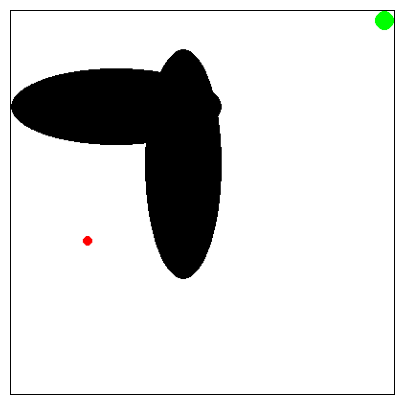

In [10]:
# BATCH_SIZE is the number of transitions sampled from the replay buffer
# GAMMA is the discount factor as mentioned in the previous section
# EPS_START is the starting value of epsilon
# EPS_END is the final value of epsilon
# EPS_DECAY controls the rate of exponential decay of epsilon, higher means a slower decay
# TAU is the update rate of the target network
# LR is the learning rate of the ``AdamW`` optimizer
BATCH_SIZE = 128
GAMMA = 0.99
EPS_START = 0.9
EPS_END = 0.05
EPS_DECAY = 1000
TAU = 0.005
LR = 1e-4

# Get number of actions from gym action space
n_actions = env.action_space.n
# Get the number of state observations
state, info = env.reset()
n_observations = len(state)

# Me trying to check the intended environment was loaded  
image = env.render()
fig, ax = plt.subplots(figsize=(5, 5))
online_rendering(image)

policy_net = DQN(n_observations, n_actions).to(device)
target_net = DQN(n_observations, n_actions).to(device)
target_net.load_state_dict(policy_net.state_dict())

optimizer = optim.AdamW(policy_net.parameters(), lr=LR, amsgrad=True)
memory = ReplayMemory(10000)


steps_done = 0


def select_action(state):
    global steps_done
    sample = random.random()
    eps_threshold = EPS_END + (EPS_START - EPS_END) * \
        math.exp(-1. * steps_done / EPS_DECAY)
    steps_done += 1
    if sample > eps_threshold:
        with torch.no_grad():
            # t.max(1) will return the largest column value of each row.
            # second column on max result is index of where max element was
            # found, so we pick action with the larger expected reward.
            return policy_net(state).max(1).indices.view(1, 1)
    else:
        return torch.tensor([[env.action_space.sample()]], device=device, dtype=torch.long)


episode_durations = []


def plot_durations(show_result=False):
    plt.figure(1)
    durations_t = torch.tensor(episode_durations, dtype=torch.float)
    if show_result:
        plt.title('Result')
    else:
        plt.clf()
        plt.title('Training...')
    plt.xlabel('Episode')
    plt.ylabel('Duration')
    plt.plot(durations_t.numpy())
    # Take 100 episode averages and plot them too
    if len(durations_t) >= 100:
        means = durations_t.unfold(0, 100, 1).mean(1).view(-1)
        means = torch.cat((torch.zeros(99), means))
        plt.plot(means.numpy())

    plt.pause(0.001)  # pause a bit so that plots are updated
    if is_ipython:
        if not show_result:
            display.display(plt.gcf())
            display.clear_output(wait=True)
        else:
            display.display(plt.gcf())

#### Training loop  

Finally, the code for training our model.

Here, you can find an optimize_model function that performs a single step of the optimization. It first samples a batch, concatenates all the tensors into a single one, computes Q(st, at) and V(st+1) = maxaQ(st+1,a) and combines them into our loss.

By definition we set V(s) = 0 is s is a terminal state.  We also use a target network to compute V(st+1) for added stability.  The target network is updated at every step with a soft update controlled by the hyperparameter TAU, which was previously defined.

In [11]:
def optimize_model():
    if len(memory) < BATCH_SIZE:
        return
    transitions = memory.sample(BATCH_SIZE)
    # Transpose the batch (see https://stackoverflow.com/a/19343/3343043 for
    # detailed explanation). This converts batch-array of Transitions
    # to Transition of batch-arrays.
    batch = Transition(*zip(*transitions))

    # Compute a mask of non-final states and concatenate the batch elements
    # (a final state would've been the one after which simulation ended)
    non_final_mask = torch.tensor(tuple(map(lambda s: s is not None,
                                          batch.next_state)), device=device, dtype=torch.bool)
    non_final_next_states = torch.cat([s for s in batch.next_state
                                                if s is not None])
    state_batch = torch.cat(batch.state)
    action_batch = torch.cat(batch.action)
    reward_batch = torch.cat(batch.reward)

    # Compute Q(s_t, a) - the model computes Q(s_t), then we select the
    # columns of actions taken. These are the actions which would've been taken
    # for each batch state according to policy_net
    state_action_values = policy_net(state_batch).gather(1, action_batch)

    # Compute V(s_{t+1}) for all next states.
    # Expected values of actions for non_final_next_states are computed based
    # on the "older" target_net; selecting their best reward with max(1).values
    # This is merged based on the mask, such that we'll have either the expected
    # state value or 0 in case the state was final.
    next_state_values = torch.zeros(BATCH_SIZE, device=device)
    with torch.no_grad():
        next_state_values[non_final_mask] = target_net(non_final_next_states).max(1).values
    # Compute the expected Q values
    expected_state_action_values = (next_state_values * GAMMA) + reward_batch

    # Compute Huber loss
    criterion = nn.SmoothL1Loss()
    loss = criterion(state_action_values, expected_state_action_values.unsqueeze(1))

    # Optimize the model
    optimizer.zero_grad()
    loss.backward()
    # In-place gradient clipping
    torch.nn.utils.clip_grad_value_(policy_net.parameters(), 100)
    optimizer.step()

Below, you can find the main training loop. At the beginning we reset the environment and obtain the initial state Tensor. Then, we sample an action, execute it, observe the next state and the reward (always 1), and optimize our model once. When the episode ends (our model fails), we restart the loop.

Below, num_episodes is set to 600 if a GPU is available, otherwise 50 episodes are scheduled so training does not take too long. However, 50 episodes is insufficient for to observe good performance on CartPole. You should see the model constantly achieve 500 steps within 600 training episodes. Training RL agents can be a noisy process, so restarting training can produce better results if convergence is not observed.

Episodic reward: tensor([0]).
Complete


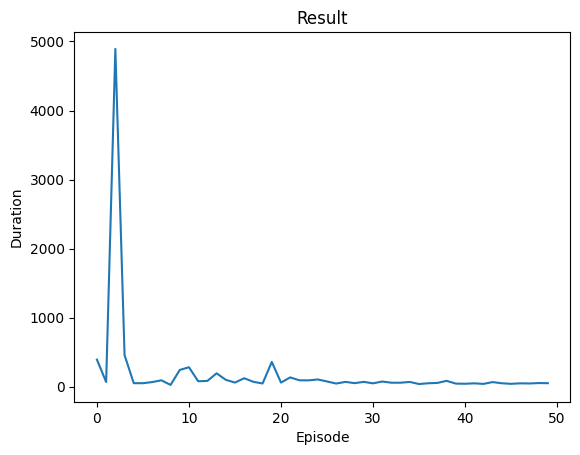

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [12]:
if torch.cuda.is_available():
    num_episodes = 600
else:
    num_episodes = 50

# Me
frames = []

for i_episode in range(num_episodes):
    # Initialize the environment and get its state
    state, info = env.reset()
    state = torch.tensor(state, dtype=torch.float32, device=device).unsqueeze(0)
    for t in count():
        action = select_action(state)
        observation, reward, terminated, truncated, _ = env.step(action.item())
        reward = torch.tensor([reward], device=device)
        done = terminated or truncated

        # Me trying to see the environment it's using
        image = env.render()
        frames.append(image)

        if terminated:
            next_state = None
        else:
            next_state = torch.tensor(observation, dtype=torch.float32, device=device).unsqueeze(0)

        # Store the transition in memory
        memory.push(state, action, next_state, reward)

        # Move to the next state
        state = next_state

        # Perform one step of the optimization (on the policy network)
        optimize_model()

        # Soft update of the target network's weights
        # θ′ ← τ θ + (1 −τ )θ′
        target_net_state_dict = target_net.state_dict()
        policy_net_state_dict = policy_net.state_dict()
        for key in policy_net_state_dict:
            target_net_state_dict[key] = policy_net_state_dict[key]*TAU + target_net_state_dict[key]*(1-TAU)
        target_net.load_state_dict(target_net_state_dict)

        if done:
            episode_durations.append(t + 1)
            plot_durations()
            #print(f"Episodic reward: {reward}.")        # Me; mainly useless, it prints "tensor[0]" and the plot gets flaky on display
            break

print('Complete')

# Me trying to see if it'll produce a video.  It works (huzzah!).  Why can't I get this to work w/o a OOM error in the above configs?
visualize(frames, "DQN_pytorch.mp4")

plot_durations(show_result=True)
plt.ioff()
plt.show()

#4. Now It's Your Turn!  

Now, you're invited to dive into the world of reinforcement learning and take control of the Puddle World environment. We encourage you to become an active participant by modifying the provided code, tweaking parameters, and experimenting with different strategies. You can come up with your own agent ideas, or use pre-exisiting libraries, and adapt them to the problem.


The goal is to build **a single agent that can generalize well across all the environment configurations.**
Once you have built your agent, test your trained agent with 100 different seeds, each seed for one episode, in the five provided configurations, save the total reward in each episode for each configuration, and submit the results as a `.csv` file as indicated in the Kaggle platform. You can set different seeds for the environment with `env.reset(seed = n)`) with `n` being the number from 1 to 100.

 Whether you're a beginner eager to explore or an experienced practitioner seeking to refine your skills, this competition offers an opportunity to apply your knowledge and creativity.



## 4.1. Submission Format

Here you can find a sample submission. Imagine that you have the episodic rewards saved in a list as shown in the below code. You can make a `submission.csv` file with the provided format as follows.

In [47]:
import pandas as pd

# Assuming you have a list of 100 episodic rewards for each configuration
# Example data structure: [(config1_rewards), (config2_rewards), ...]

# REPLACE THIS example data with your actual rewards data
# Have to get each config (for a given algorithm) to produce 100 rewards (total_rewards per episode for 100 episodes; this presumes they reach "done")
episode_rewards_per_configuration = [
     range(-120, -20),  # Configuration 1 rewards
    range(-120, -20),   # Configuration 2 rewards
    range(-120, -20),  # Configuration 3 rewards
    range(-120, -20),  # Configuration 4 rewards
   range(-120, -20),   # Configuration 5 rewards
]

# Define the column names
columns = ['seed_ID', 'ep_reward_pw1', 'ep_reward_pw2', 'ep_reward_pw3', 'ep_reward_pw4', 'ep_reward_pw5']

# Create a list of dictionaries to store data
data = []

# Populate the list with episode IDs and rewards
for episode_id in range(1, 101):  # Assuming 100 episodes
    row_data = {'seed_ID': episode_id}
    for i, rewards in enumerate(episode_rewards_per_configuration):
        row_data[columns[i + 1]] = rewards[episode_id - 1]
    data.append(row_data)

# Create DataFrame from the list of dictionaries
df = pd.DataFrame(data)

# Define the file name for saving the results
csv_file_name = "submission.csv"

# Save the DataFrame to a CSV file
df.to_csv(csv_file_name, index=False)

print("Results saved successfully to", csv_file_name)


Results saved successfully to submission.csv


In [48]:
import pandas as pd

# Define the file name for loading the results
csv_file_name = "submission.csv"

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_name)

# Display the DataFrame
print(df)

    seed_ID  ep_reward_pw1  ep_reward_pw2  ep_reward_pw3  ep_reward_pw4  \
0         1           -120           -120           -120           -120   
1         2           -119           -119           -119           -119   
2         3           -118           -118           -118           -118   
3         4           -117           -117           -117           -117   
4         5           -116           -116           -116           -116   
..      ...            ...            ...            ...            ...   
95       96            -25            -25            -25            -25   
96       97            -24            -24            -24            -24   
97       98            -23            -23            -23            -23   
98       99            -22            -22            -22            -22   
99      100            -21            -21            -21            -21   

    ep_reward_pw5  
0            -120  
1            -119  
2            -118  
3            -117  

# 6. Fun Expedition

You can also modify the properties of the environment such as the initial state, puddle locations, and more. You can play around with the environment and challenge your agent to tackle the hardest versions of this environment!

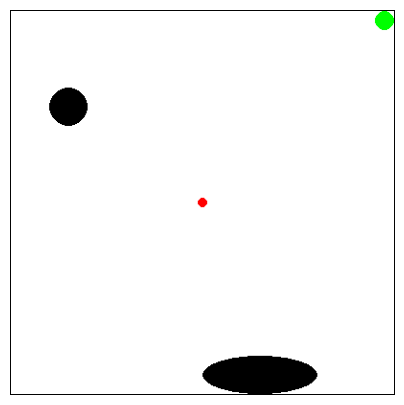

In [49]:
env = gym.make(
        "PuddleWorld-v0",
        start=[0.5,0.5],
        goal=[1.,1.],
        goal_threshold=0.1,
        noise=0.01,
        thrust=0.05,
        puddle_top_left=[[0.1  , 0.8],[0.5, 0.1 ]],
        puddle_width=[[0.1, 0.1 ],[0.3, 0.1]]
    )

obs, info = env.reset()
image = env.render()
fig, ax = plt.subplots(figsize=(5, 5))
online_rendering(image)
